In [1]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard fbe67e465375231474a2ad80a4389efc77ecff99

Cloning into 'yolov5'...
remote: Enumerating objects: 16008, done.
remote: Counting objects: 100% (41/41), done.
remote: Compressing objects: 100% (28/28), done.
remote: Total 16008 (delta 22), reused 21 (delta 13), pack-reused 15967
Receiving objects: 100% (16008/16008), 14.60 MiB | 14.26 MiB/s, done.
Resolving deltas: 100% (10988/10988), done.
/Users/shravaneekale/Desktop/tetra/yolov5
HEAD is now at fbe67e4 Fix `OMP_NUM_THREADS=1` for macOS (#8624)


In [7]:
!pip install torch


In [9]:
pip install torch torchvision torchaudio


DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
  Using cached torch-2.1.0-cp39-none-macosx_10_9_x86_64.whl (147.0 MB)
  Using cached torchvision-0.16.0-cp39-cp39-macosx_10_13_x86_64.whl (1.7 MB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 12.7 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 13.6 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.1/133.1 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 173.4/173.4 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 15.6 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.6/62.6 kB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 15.9 MB/s eta 0:00:0000:

In [11]:

!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.downloads import attempt_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 2.1.0 CPU


In [15]:


!pip install roboflow





In [19]:
import sys
sys.path.append("/Users/shravaneekale/opt/anaconda3/lib/python3.9/site-packages")


In [20]:
from roboflow import Roboflow
rf = Roboflow(api_key="tz7L5PIi2z1jhkt7XWh8")
project = rf.workspace("tetra-pak-1xq6m").project("tetra-pkad3")
dataset = project.version(2).download("yolov5")



loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to tetra-2 in yolov5pytorch:: 100%|██████████| 484/484 [00:00<00:00, 1732.64it/s]


In [21]:
%cd /content/yolov5

from roboflow import Roboflow
rf = Roboflow(api_key="tz7L5PIi2z1jhkt7XWh8")
project = rf.workspace("tetra-pak-1xq6m").project("tetra-pkad3")
dataset = project.version(2).download("yolov5")

[Errno 2] No such file or directory: '/content/yolov5'
/Users/shravaneekale/Desktop/tetra/yolov5
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to tetra-2 in yolov5pytorch:: 100%|██████████| 484/484 [00:00<00:00, 2633.36it/s]


In [22]:

%cat {dataset.location}/data.yaml

names:
- tetra
nc: 1
train: tetra-2/train/images
val: tetra-2/valid/images


# Define Model Configuration and Architecture




In [23]:
# define number of classes based on YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [24]:

%cat /Users/shravaneekale/Desktop/tetra/yolov5/models/yolov5n.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.25  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [25]:

from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [27]:
%%writetemplate /Users/shravaneekale/Desktop/tetra/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Train Custom YOLOv5 Detector





In [34]:
pip install protobuf


DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 409.4/409.4 kB 6.9 MB/s eta 0:00:0000:01
  DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621

[notice] A new release of pip available: 22.3.1 -> 23.3
[notice] To update, run: python3.9 -m pip install --upgrade pip
Note: you m

In [36]:
# train yolov5s on custom data for 100 epochs
# time its performance


In [37]:
%time
%cd /Users/shravaneekale/Desktop/tetra/yolov5/
!python train.py --img 416 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

CPU times: user 7 µs, sys: 1 µs, total: 8 µs
Wall time: 53.9 µs
/Users/shravaneekale/Desktop/tetra/yolov5


1675.54s - pydevd: Sending message related to process being replaced timed-out after 5 seconds


# Evaluate Custom YOLOv5 Detector Performance

In [12]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

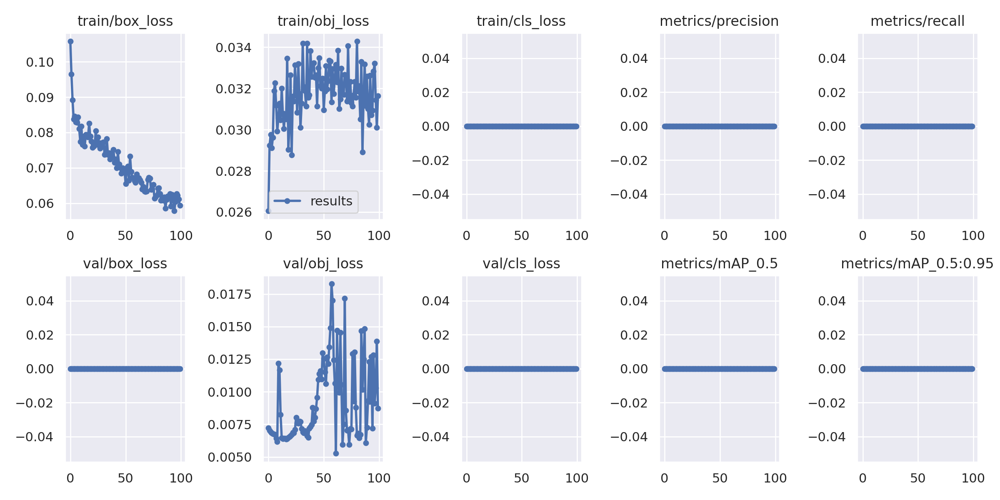

In [14]:

from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results2/results.png', width=1000)  # view results.png


Visualize  Training Data with Labels



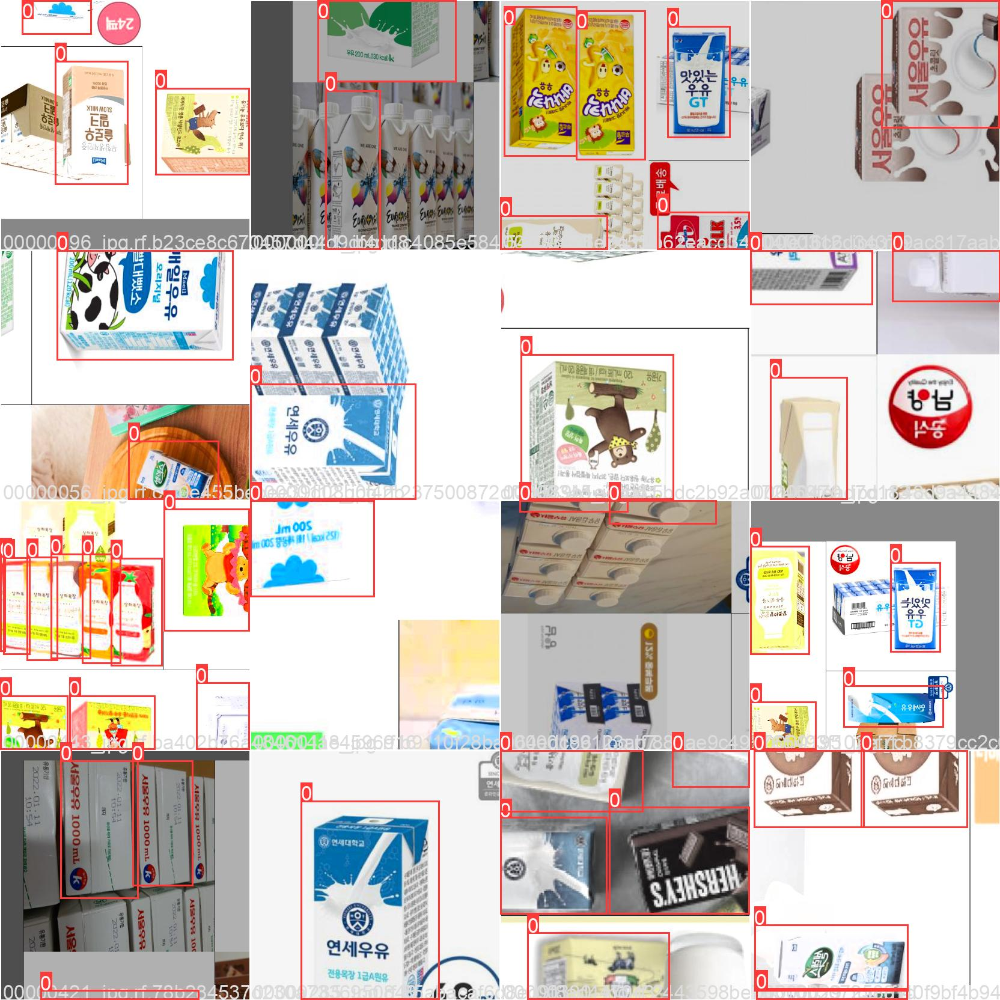

In [15]:

Image(filename='/content/yolov5/runs/train/yolov5s_results2/train_batch0.jpg', width=900)

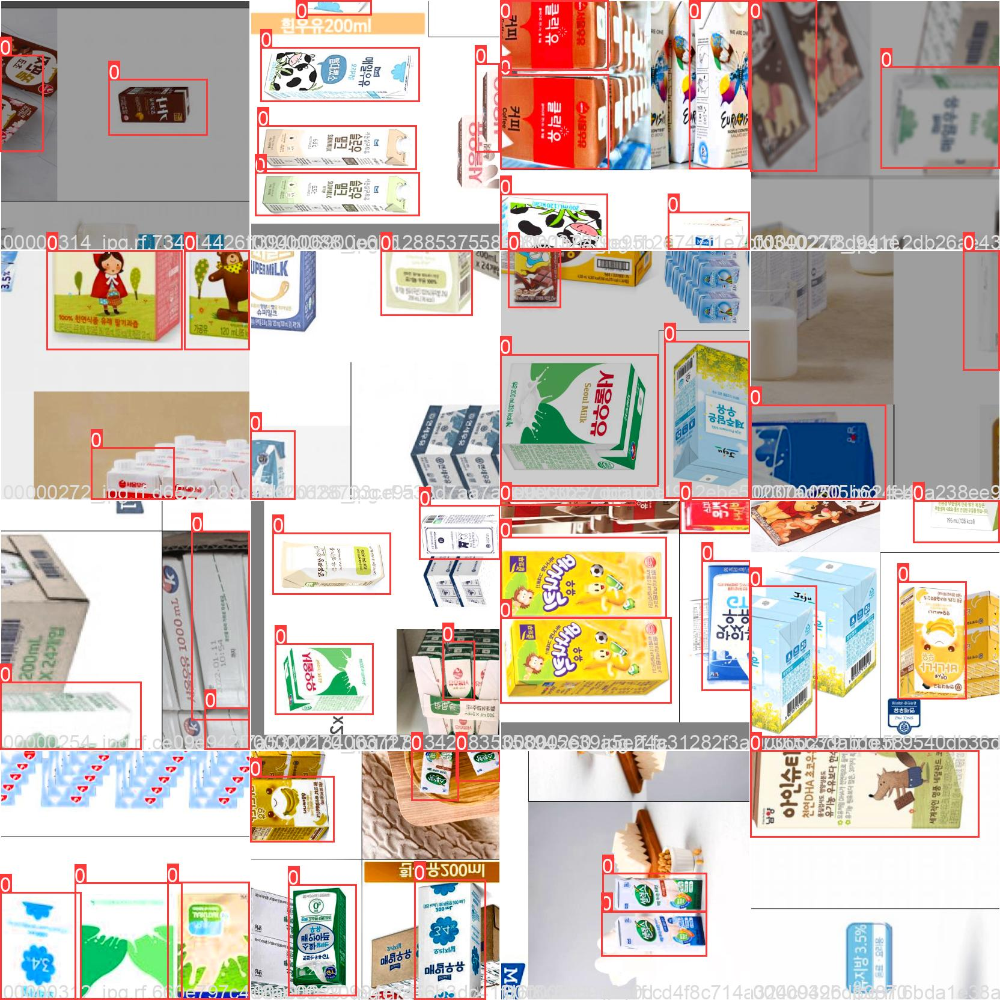

In [44]:

Image(filename='/content/yolov5/runs/train/yolov5s_results2/train_batch1.jpg', width=900)

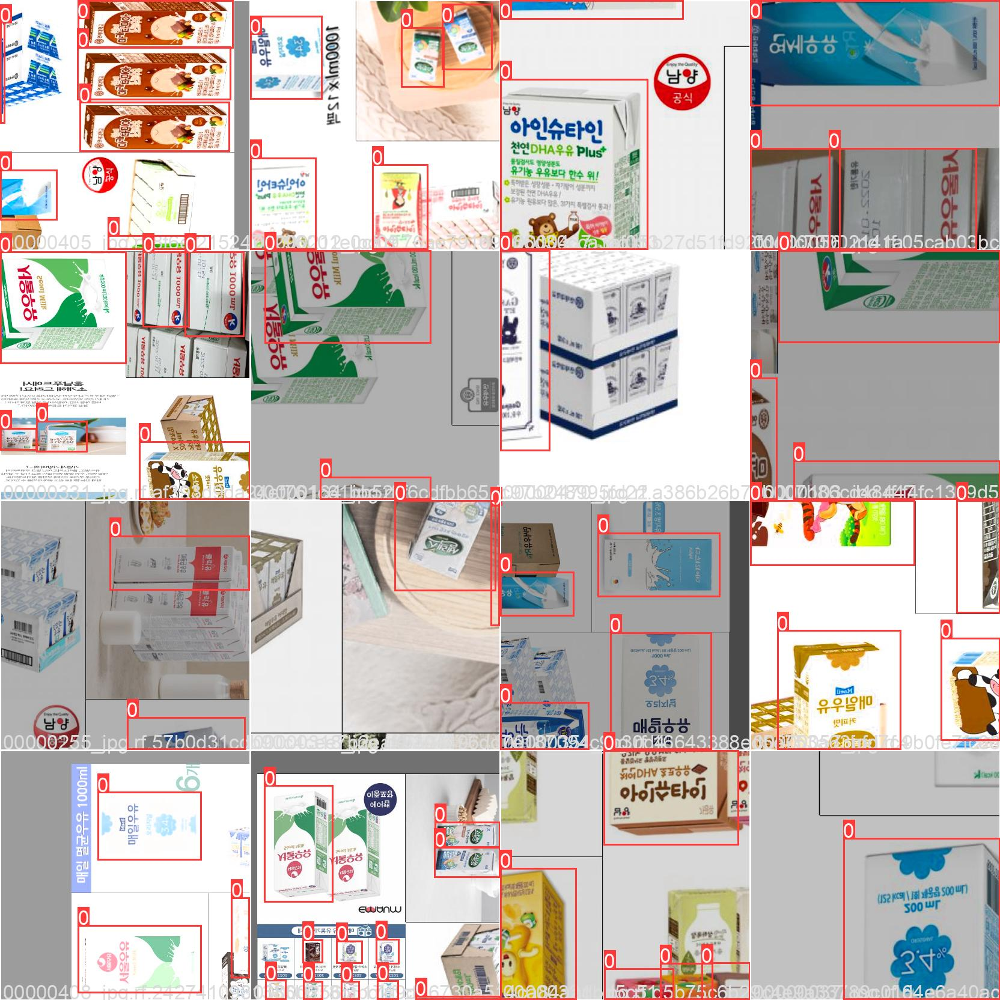

In [19]:

Image(filename='/content/yolov5/runs/train/yolov5s_results2/train_batch2.jpg', width=900)

#Test Data

In [20]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [21]:
%ls runs/train/yolov5s_results2/weights

best.pt  last.pt


In [41]:

%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results2/weights/best.pt --img 416 --conf 0.15 --source /content/yolov5/test/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results2/weights/best.pt'], source=/content/yolov5/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.15, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-306-gfbe67e4 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7246518 parameters, 0 gradients, 16.7 GFLOPs
image 1/40 /content/yolov5/test/images/00000400_jpg.rf.6b6ca4c1a8ae7eb06e50f7393326f503 8.36.17 pm.jpg: 416x416 1 tetra, Done. (0.008s)
image 2/40 /content/yolov5/test/images/00000400_jpg.rf.87d7ae4dfea64ff910fbce07582d3404 8.36.16 pm.jpg: 416x416 3 tetras, Done. (0.009s)
image 3/40 /content/yolov5/test/images/00

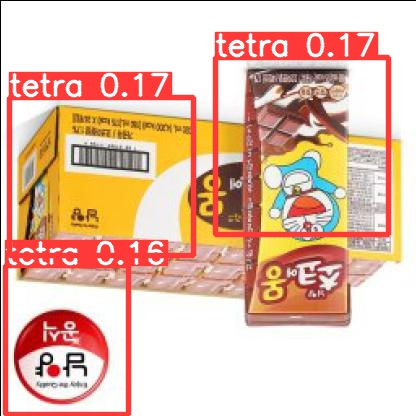

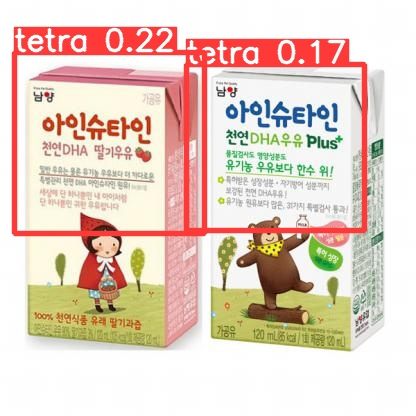

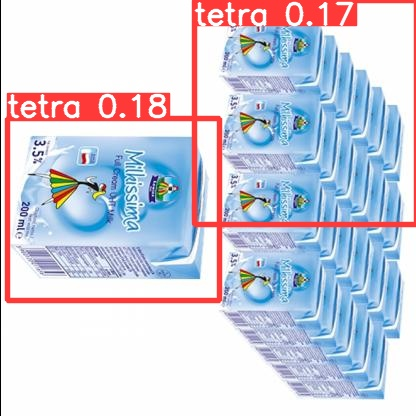

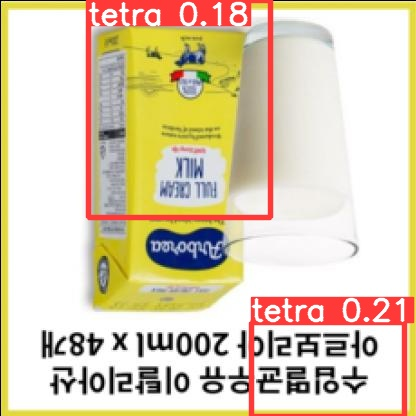

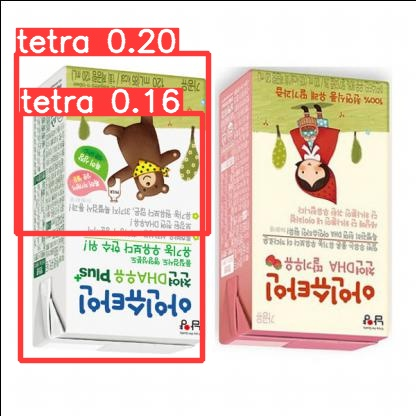

...

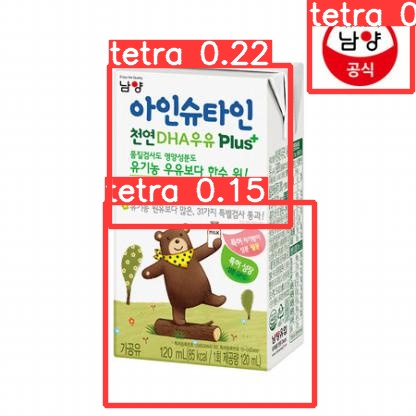

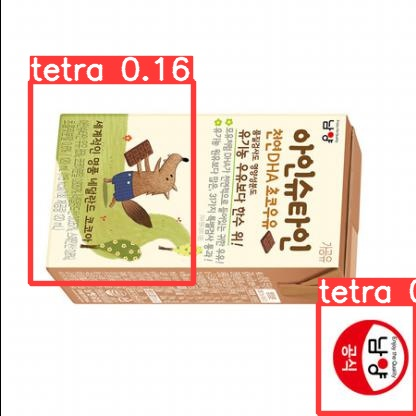

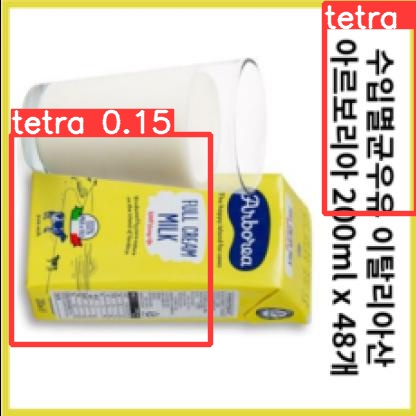

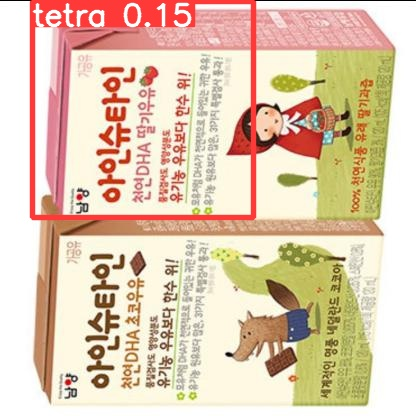

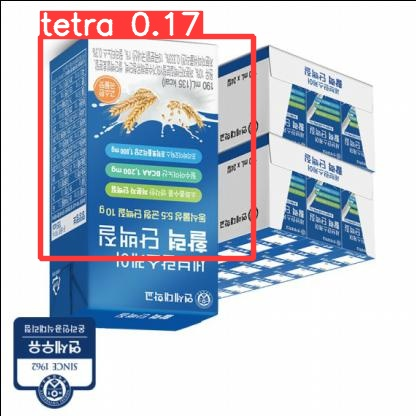

In [42]:


import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp11/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")



In [46]:
pip install ultralytics


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.5/644.5 kB 8.0 MB/s eta 0:00:00


In [47]:
from ultralytics import YOLO
import cv2

model = YOLO("/content/yolov5/runs/train/yolov5s_results2/weights/best.pt") # add your model here

results = model.predict(source= "0", show = True)
print(results)

WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()



TypeError: ignored